<a href="https://colab.research.google.com/github/Fatimat01/cv_human_detection/blob/main/notebooks/FinProj1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Install YOLOv8 and KaggleHub
!pip install ultralytics kagglehub

# Import YOLO
from ultralytics import YOLO


In [ ]:
import kagglehub

# Download dataset
path = kagglehub.dataset_download("adilshamim8/people-detection")
print("Dataset path:", path)


Using Colab cache for faster access to the 'people-detection' dataset.
Dataset path: /kaggle/input/people-detection


In [ ]:
import os

# Look at top-level folders
print("Top-level:", os.listdir(path))

# Look inside train and valid
print("Train folder:", os.listdir(os.path.join(path, "train")))
print("Valid folder:", os.listdir(os.path.join(path, "valid")))


Top-level: ['README.dataset.txt', 'valid', 'test', 'train']
Train folder: ['train']
Valid folder: ['valid']


2008_002129_jpg.rf.eabffaccdb1ccd62cc23ad10cb20b72d.jpg | People detected: 1


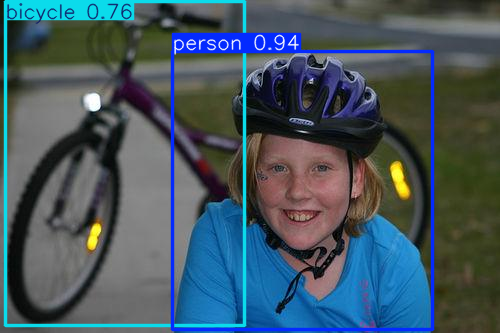

photo-1533906395497-33f8df24d687_jpg.rf.c86a32ffdcdd70ff300d00d052a32c81.jpg | People detected: 5


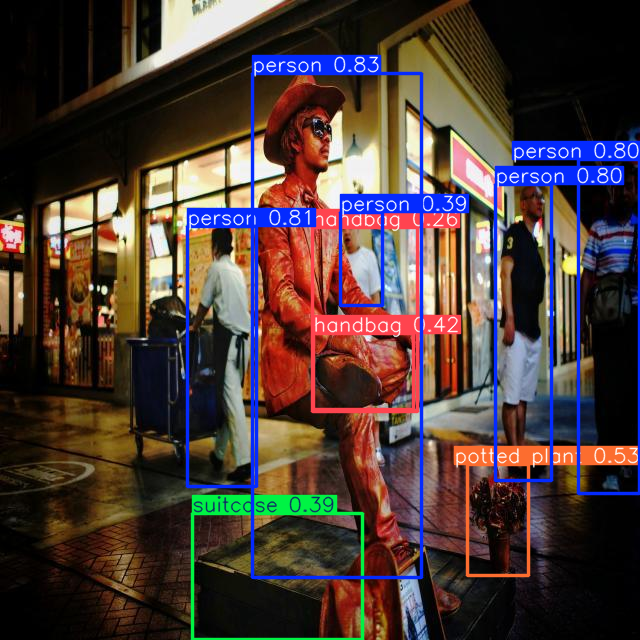

2010_001682_jpg.rf.e9de891b3d1faa5a447c7f07e9801daf.jpg | People detected: 3


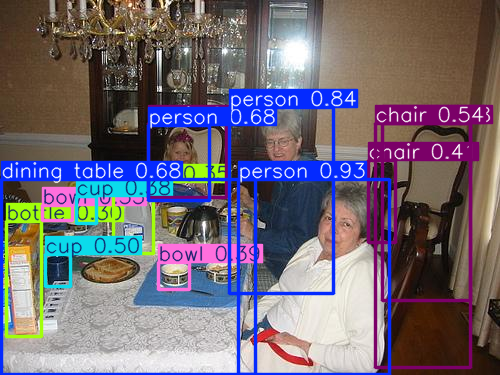

20230127_182724_mp4-124_jpg.rf.7fff3ea2bef719b6ed090e6f66f5f6f4.jpg | People detected: 6


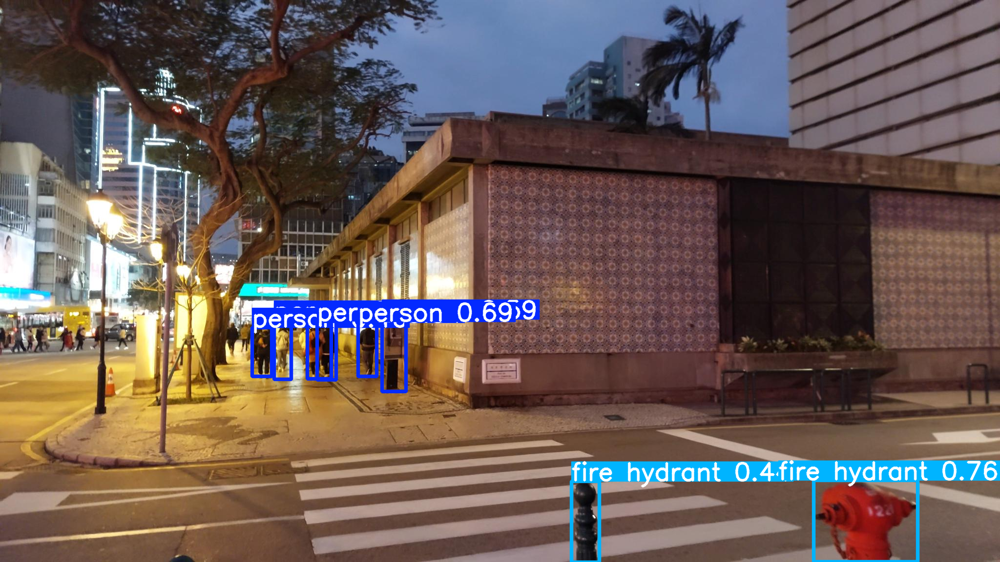

000230_jpg.rf.eba710b00812dbda1578cd01a496be05.jpg | People detected: 23


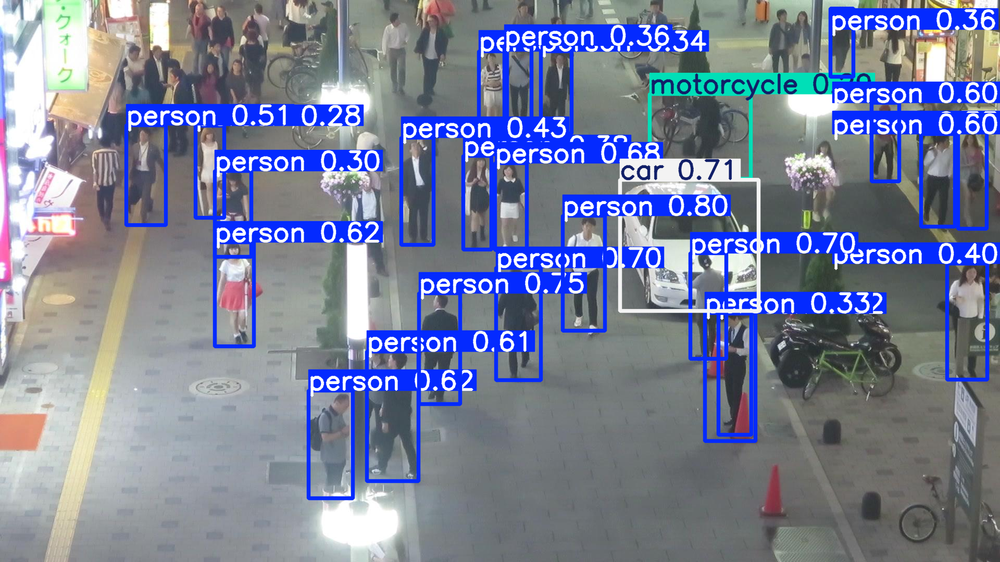

In [ ]:
from ultralytics import YOLO
import glob, os

# Load pretrained YOLO
model = YOLO("yolov8n.pt")

# Run inference on a few images
image_files = glob.glob(os.path.join(path, "**", "*.jpg"), recursive=True)

for img_path in image_files[:5]:
    results = model.predict(source=img_path, conf=0.25, verbose=False)
    people_count = sum(1 for box in results[0].boxes if int(box.cls[0]) == 0)
    print(f"{os.path.basename(img_path)} | People detected: {people_count}")
    results[0].show()


In [ ]:
from ultralytics import YOLO

models = {
    "YOLOv8n": YOLO("yolov8n.pt"),
    "YOLOv8s": YOLO("yolov8s.pt"),
    "YOLOv10n": YOLO("yolov10n.pt"),   # YOLOv10 nano
    "YOLOv10s": YOLO("yolov10s.pt"),   # YOLOv10 small
    "YOLOv11n": YOLO("yolo11n.pt"),    # YOLOv11 nano
    "YOLOv11s": YOLO("yolo11s.pt")     # YOLOv11 small
}


In [ ]:
import glob, os

# Collect images
image_files = glob.glob(os.path.join(path, "**", "*.jpg"), recursive=True)

# Use first 10 images for demo
sample_images = image_files[:10]


In [ ]:
import time

results_summary = []

for model_name, model in models.items():
    for img_path in sample_images:
        start = time.time()
        results = model.predict(source=img_path, conf=0.25, verbose=False)
        elapsed = time.time() - start

        people_count = sum(1 for box in results[0].boxes if int(box.cls[0]) == 0)
        results_summary.append({
            "model": model_name,
            "image": os.path.basename(img_path),
            "people_count": people_count,
            "time_sec": round(elapsed, 3)
        })


In [ ]:
import pandas as pd

df = pd.DataFrame(results_summary)
print(df)

# Average performance per model
print("\nAverage results per model:")
print(df.groupby("model")[["people_count", "time_sec"]].mean())


       model                                              image  people_count  \
0    YOLOv8n  2008_002129_jpg.rf.eabffaccdb1ccd62cc23ad10cb2...             1   
1    YOLOv8n  photo-1533906395497-33f8df24d687_jpg.rf.c86a32...             5   
2    YOLOv8n  2010_001682_jpg.rf.e9de891b3d1faa5a447c7f07e98...             3   
3    YOLOv8n  20230127_182724_mp4-124_jpg.rf.7fff3ea2bef719b...             6   
4    YOLOv8n  000230_jpg.rf.eba710b00812dbda1578cd01a496be05...            23   
5    YOLOv8n  1323_person_jpg.rf.e63b2a7ae1237f5b66805ee69c3...             0   
6    YOLOv8n  -1_-Av513706663-P1-_mp4-22_jpg.rf.7bdce57b726c...            10   
7    YOLOv8n  URH4HHQBTXAX_jpg.rf.dd526707b4b2ac53247ecb69f3...             2   
8    YOLOv8n  000097_jpg.rf.9417a80fe19cfae9be60d40a1ca330b4...            27   
9    YOLOv8n  photo-1497021707778-a743a0bb2961_jpg.rf.357f7e...             1   
10   YOLOv8s  2008_002129_jpg.rf.eabffaccdb1ccd62cc23ad10cb2...             1   
11   YOLOv8s  photo-15339063

/tmp/ipython-input-2027123325.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_df, x="model", y="people_count", ax=axes[0], palette="Blues")
/tmp/ipython-input-2027123325.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_df, x="model", y="time_sec", ax=axes[1], palette="Greens")


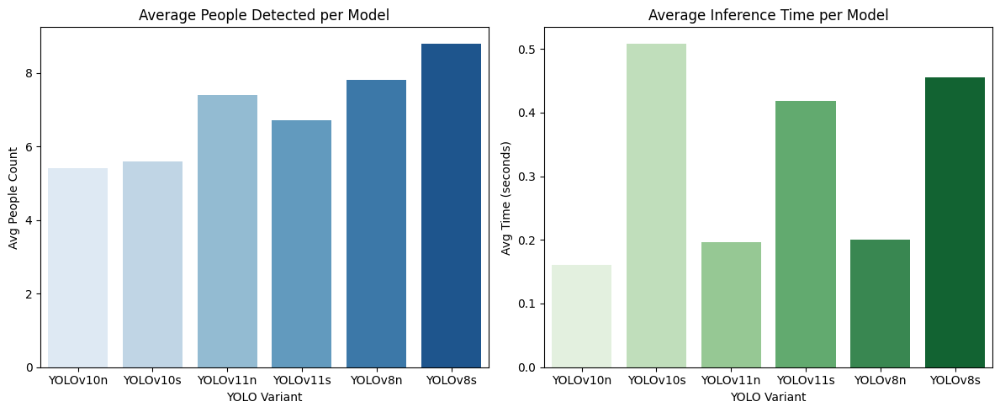

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute averages per model
avg_df = df.groupby("model")[["people_count", "time_sec"]].mean().reset_index()

# Set up side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Bar chart: average people detected
sns.barplot(data=avg_df, x="model", y="people_count", ax=axes[0], palette="Blues")
axes[0].set_title("Average People Detected per Model")
axes[0].set_ylabel("Avg People Count")
axes[0].set_xlabel("YOLO Variant")

# Bar chart: average inference time
sns.barplot(data=avg_df, x="model", y="time_sec", ax=axes[1], palette="Greens")
axes[1].set_title("Average Inference Time per Model")
axes[1].set_ylabel("Avg Time (seconds)")
axes[1].set_xlabel("YOLO Variant")

plt.tight_layout()
plt.show()


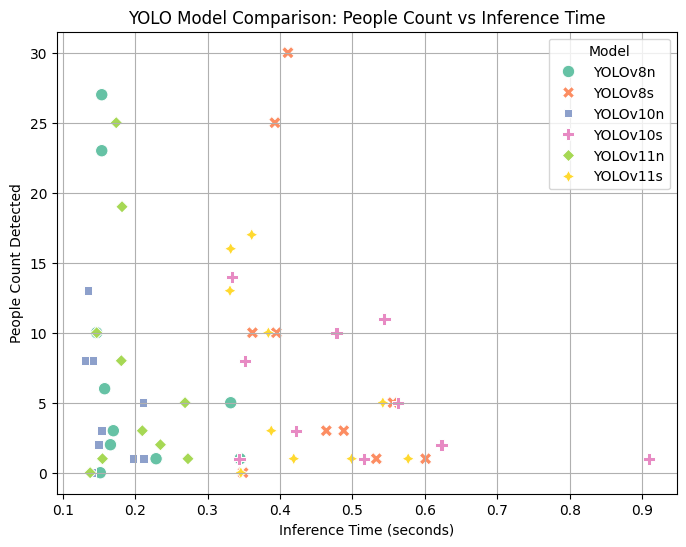

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Scatter plot: each image result
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df,
    x="time_sec",
    y="people_count",
    hue="model",
    style="model",
    palette="Set2",
    s=80
)

plt.title("YOLO Model Comparison: People Count vs Inference Time")
plt.xlabel("Inference Time (seconds)")
plt.ylabel("People Count Detected")
plt.legend(title="Model")
plt.grid(True)
plt.show()


In [ ]:
#Installs
!pip install ultralytics kagglehub matplotlib seaborn pandas

from ultralytics import YOLO
import kagglehub
import glob, os, time
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.image as mpimg

In [ ]:
#Download dataset + print
path = kagglehub.dataset_download("adilshamim8/people-detection")
print("Dataset path:", path)

# Collect sample images only 10 for now
image_files = glob.glob(os.path.join(path, "**", "*.jpg"), recursive=True)
sample_images = image_files[:10]

Using Colab cache for faster access to the 'people-detection' dataset.
Dataset path: /kaggle/input/people-detection


In [ ]:
# Load models
models = {
    "YOLOv8n": YOLO("yolov8n.pt"),
    "YOLOv8s": YOLO("yolov8s.pt"),
    "YOLOv10n": YOLO("yolov10n.pt"),
    "YOLOv10s": YOLO("yolov10s.pt"),
    "YOLOv11n": YOLO("yolo11n.pt"),
    "YOLOv11s": YOLO("yolo11s.pt")
}

In [ ]:
#Run inference and collect results
results_summary = []

for model_name, model in models.items():
    for img_path in sample_images:
        start = time.time()
        results = model.predict(source=img_path, conf=0.25, verbose=False)
        elapsed = time.time() - start

        # Count people (class 0 in COCO)
        people_count = sum(1 for box in results[0].boxes if int(box.cls[0]) == 0)
        results_summary.append({
            "model": model_name,
            "image": os.path.basename(img_path),
            "people_count": people_count,
            "time_sec": round(elapsed, 3)
        })

In [ ]:
df = pd.DataFrame(results_summary)
print(df.head())

     model                                              image  people_count  \
0  YOLOv8n  2008_002129_jpg.rf.eabffaccdb1ccd62cc23ad10cb2...             1   
1  YOLOv8n  photo-1533906395497-33f8df24d687_jpg.rf.c86a32...             5   
2  YOLOv8n  2010_001682_jpg.rf.e9de891b3d1faa5a447c7f07e98...             3   
3  YOLOv8n  20230127_182724_mp4-124_jpg.rf.7fff3ea2bef719b...             6   
4  YOLOv8n  000230_jpg.rf.eba710b00812dbda1578cd01a496be05...            23   

   time_sec  
0     0.366  
1     0.391  
2     0.324  
3     0.267  
4     0.226  


/tmp/ipython-input-1633330749.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_df, x="model", y="people_count", ax=axes[0], palette="Blues")
/tmp/ipython-input-1633330749.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=avg_df, x="model", y="time_sec", ax=axes[1], palette="Greens")


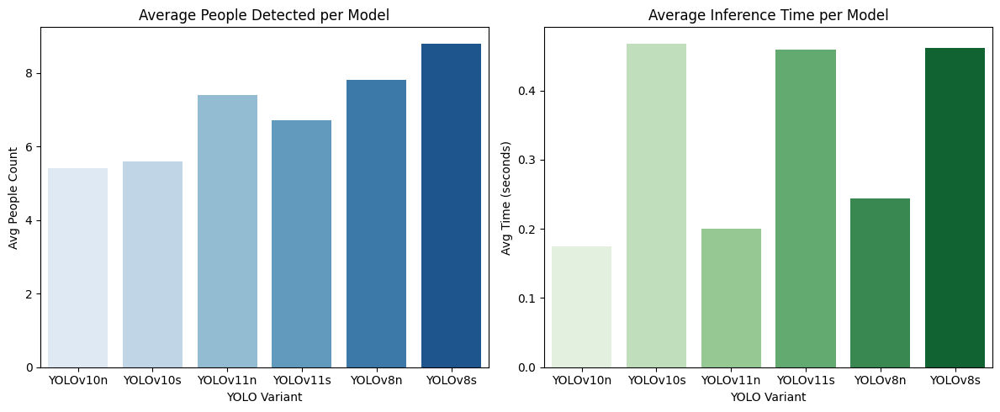

In [ ]:
#Bar charts (average comparison)
avg_df = df.groupby("model")[["people_count", "time_sec"]].mean().reset_index()

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
sns.barplot(data=avg_df, x="model", y="people_count", ax=axes[0], palette="Blues")
axes[0].set_title("Average People Detected per Model")
axes[0].set_ylabel("Avg People Count")
axes[0].set_xlabel("YOLO Variant")

sns.barplot(data=avg_df, x="model", y="time_sec", ax=axes[1], palette="Greens")
axes[1].set_title("Average Inference Time per Model")
axes[1].set_ylabel("Avg Time (seconds)")
axes[1].set_xlabel("YOLO Variant")

plt.tight_layout()
plt.show()

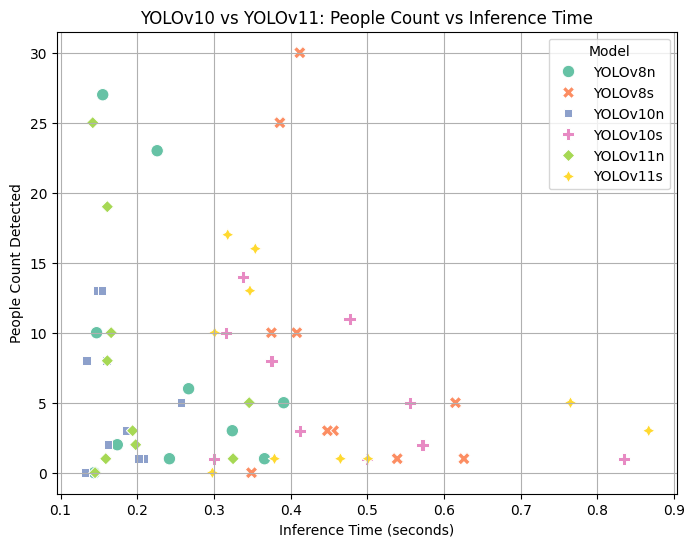

In [ ]:
#Scatter plot (per-image trade-off)
plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df,
    x="time_sec",
    y="people_count",
    hue="model",
    style="model",
    palette="Set2",
    s=80
)
plt.title("YOLOv10 vs YOLOv11: People Count vs Inference Time")
plt.xlabel("Inference Time (seconds)")
plt.ylabel("People Count Detected")
plt.legend(title="Model")
plt.grid(True)
plt.show()

In [ ]:
def compare_models_on_image(image_path, models):
    os.makedirs("comparisons", exist_ok=True)
    annotated_paths = []

    # Run inference and save annotated images
    for model_name, model in models.items():
        results = model.predict(
            source=image_path,
            conf=0.25,
            save=True,
            project="comparisons",
            name=model_name,
            verbose=False
        )
        # Grab the actual annotated file path
        saved_file = os.path.join(results[0].save_dir, os.path.basename(results[0].path))
        annotated_paths.append(saved_file)

    # Plot side by side
    fig, axes = plt.subplots(1, len(annotated_paths), figsize=(20, 5))
    for ax, path, model_name in zip(axes, annotated_paths, models.keys()):
        img = mpimg.imread(path)
        ax.imshow(img)
        ax.set_title(model_name)
        ax.axis("off")
    plt.suptitle(f"Comparison on {os.path.basename(image_path)}", fontsize=14)
    plt.tight_layout()
    plt.show()


Results saved to /content/comparisons/YOLOv8n12
Results saved to /content/comparisons/YOLOv8s12
Results saved to /content/comparisons/YOLOv10n12
Results saved to /content/comparisons/YOLOv10s12
Results saved to /content/comparisons/YOLOv11n12
Results saved to /content/comparisons/YOLOv11s12


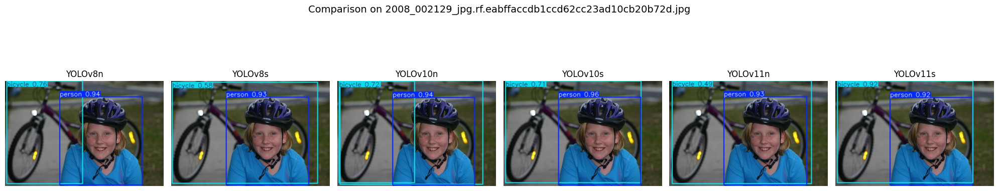

In [ ]:
compare_models_on_image(sample_images[0], models)


Results saved to /content/comparisons/YOLOv8n13
Results saved to /content/comparisons/YOLOv8s13
Results saved to /content/comparisons/YOLOv10n13
Results saved to /content/comparisons/YOLOv10s13
Results saved to /content/comparisons/YOLOv11n13
Results saved to /content/comparisons/YOLOv11s13


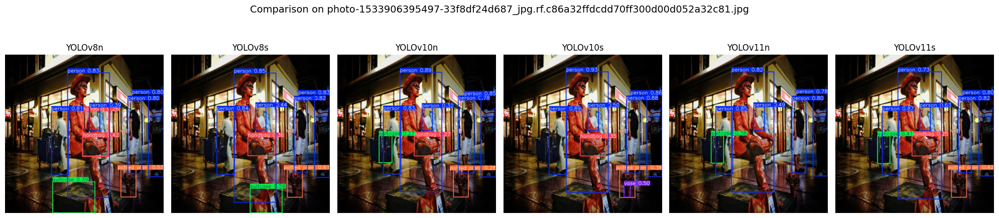

In [ ]:
compare_models_on_image(sample_images[1], models)


Results saved to /content/comparisons/YOLOv8n14
Results saved to /content/comparisons/YOLOv8s14
Results saved to /content/comparisons/YOLOv10n14
Results saved to /content/comparisons/YOLOv10s14
Results saved to /content/comparisons/YOLOv11n14
Results saved to /content/comparisons/YOLOv11s14


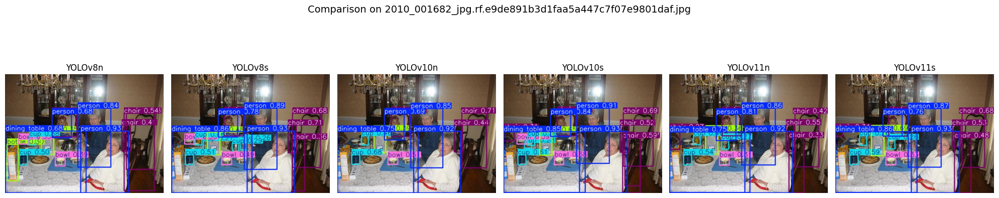

In [ ]:
compare_models_on_image(sample_images[2], models)

Results saved to /content/comparisons/YOLOv8n15
Results saved to /content/comparisons/YOLOv8s15
Results saved to /content/comparisons/YOLOv10n15
Results saved to /content/comparisons/YOLOv10s15
Results saved to /content/comparisons/YOLOv11n15
Results saved to /content/comparisons/YOLOv11s15


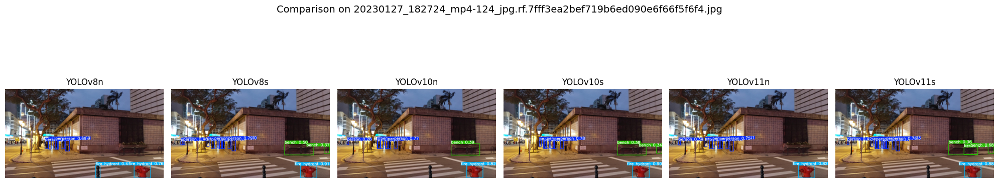

In [ ]:
compare_models_on_image(sample_images[3], models)

Results saved to /content/comparisons/YOLOv8n16
Results saved to /content/comparisons/YOLOv8s16
Results saved to /content/comparisons/YOLOv10n16
Results saved to /content/comparisons/YOLOv10s16
Results saved to /content/comparisons/YOLOv11n16
Results saved to /content/comparisons/YOLOv11s16


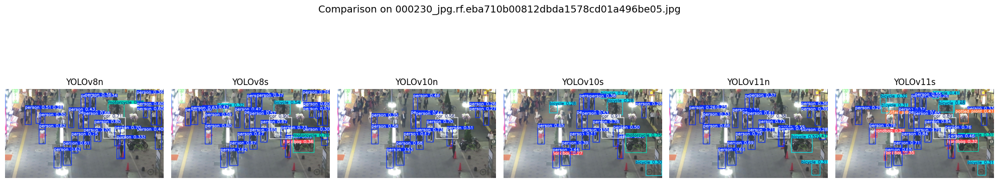

In [ ]:
compare_models_on_image(sample_images[4], models)

Results saved to /content/comparisons/YOLOv8n17
Results saved to /content/comparisons/YOLOv8s17
Results saved to /content/comparisons/YOLOv10n17
Results saved to /content/comparisons/YOLOv10s17
Results saved to /content/comparisons/YOLOv11n17
Results saved to /content/comparisons/YOLOv11s17


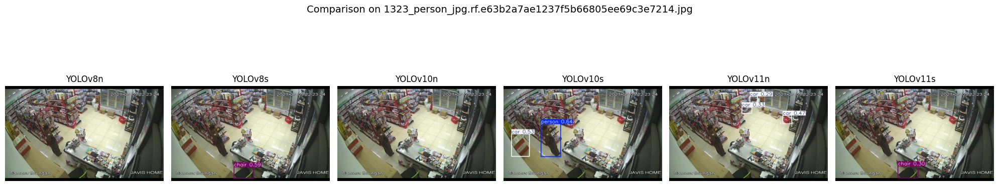

In [ ]:
compare_models_on_image(sample_images[5], models)